- [Introduction]
- **[Sona Section]**
- [Load data - and create two versions with night time dummy]
- [Descriptive Graphs]
    - [Time series-daily] (done)
    - [Time series - monthly] (done)
    - [Plot heat map for time of occurrence] (done)
    - [Dual sided line plot for day/night] (done)
    - [Histogram with type of crime] (done)
    - [Pie-graph with type of crime by day and night]

- [Merge data with controls]
    - [Additional Regressions]
        - [Impact of Corona with line plot] (done)
        - [Impact of Stimulus payments with line plot]
- [Merge with Brightness data]
    - [Regression for impact of night lights on B] (done)
    - [Regression for impact of night lights on crime with controls for Poverty](done)
    - [Districts ] (done)
    - ? Look at effect of Portland neighbourhood special funding.
- [Use call for service data]
    - [Geographical prediction]


In [1]:
###Loading in necessary packages
#Reading in the data
import numpy as np
import pandas as pd
import seaborn as sns
#import plotly.express as px
import matplotlib.pyplot as plt
import os
import calplot #pip
import datetime
import openpyxl
import statsmodels.formula.api as sm
import statsmodels.formula.api as smf
from statsmodels.iolib.summary2 import summary_col
from pandas.plotting import andrews_curves
import geopandas
#conda install -c conda-forge utm
import sklearn

import shapely
import folium
from folium.plugins import FastMarkerCluster

from geopandas.tools import sjoin
#from shapely.geometry import Point, Polygon
#import geoplot as gplty
from shapely.geometry import Point, Polygon
from geopandas import GeoDataFrame, GeoSeries


from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm



from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

from sklearn.tree import export_graphviz
import pydot


## Portland Crime Data Analysis


The Portland Police Bureau was among the many law enforcement agencies which were selected to be a part of the National Crime Statistics Exchange. This program was desgined to compile a national sample of incident-based crime data using the National Incident Based Reporting System. 
The National Incident Based Reporting System was implemented to improve the overall quality of crime data which was collected by law enforcement which greatly expanded the uniformity requirement of crime occurences. This information includes information on victims, known offenders, relationships between victims and offenders, arrestees, as well as property invovled in crimes.

Though the data reported by the UCR Program's traditional summary reporting program existed prior to this, the NIBRS goes much deeper because of the ability to provicde details on on separate offenses within the same incident—including information on victims, known offenders, relationships between victims and offenders, arrestees, and property involved in crimes.


The data used for this analysis can be found here https://www.portlandoregon.gov/police/71978.

The data is detailed, capturing every crime occurence, the type of crime, the category and neighborhood of occurence.


In [2]:
clean_data=pd.read_csv("data/df_with_controls_nighttime.csv")


**Date** - Date the incident occurred. The exact occur date is sometimes unknown. In most situations, the first possible date the crime could have occurred is used as the occur date. (For example, victims return home from a week-long vacation to find their home burglarized. The burglary could have occurred at any point during the week. The first date of their vacation would be listed as the occur date.)

**Time** - Time the incident occured. The exact occur time is sometimes unknown. In most situations, the first possible time the crime could have occured is used as the occur time.
The time is reported in the 24-hour clock format, with the first two digits representing hour (ranges from 00 to 23) and the second two digits representing minutes (ranges from 00 to 59).
Note: By default, Microsoft Excel removes leading zeroes when importing data. For more help with this issue, refer to Microsoft's help page.

**Address** - Address of reported incident at the 100 block level (e.g.: 1111 SW 2nd Ave would be 1100 Block SW 2nd Ave).
To protect the identity of victims and other privacy concerns, the address location of certain case types are not released.

**Open Data Lat / Lon** - Found to be missing in all cases

**Neighborhood** - Neighborhood where incident occurred.
If the neighborhood name is missing, the incident occurred outside of the boundaries of the Portland neighborhoods or at a location that could not be assigned to a specific address in the system (e.g., Portland, near Washington Park, on the streetcar, etc.). Note: Neighborhood boundaries and designations vary slightly from those found on the Office of Community & Civic Life website.


In [3]:
##Data cleaning
def clean_data():
    
   if __name__ == "__main__":

     cwd = os.getcwd()
     files = os.listdir("data")
     prefix='CrimeData-'
     file= list(filter(lambda file: file.startswith(prefix),files))

     df = []
     for f in file:
         csv_file="data"+ "/" + f
         print(csv_file)
         df.append(pd.read_csv(csv_file))
         df_full = pd.concat(df, ignore_index=True)


     df_full.to_csv("data/crime_data", encoding='utf-8', index=False)
     data= pd.read_csv("data/crime_data")
     #Cleaning the Dates
     data['OccurDate'] = pd.to_datetime(data['OccurDate'],format='%d/%m/%Y')
     data['OccurMonth_Year']  = pd.to_datetime(data['OccurDate']).dt.to_period('M')

     to_drop = ['Address',
               'CrimeAgainst',
               'OffenseType',
               'OpenDataLat',
               'OpenDataLon',
               'OpenDataX',
               'OpenDataY',
               'ReportDate']


     data= data[data.OccurMonth_Year>"2015-06-01"]
     data= data[data.OccurMonth_Year<"2021-06-01"]

     data.drop(to_drop, inplace=True, axis=1)
     return data

clean_data=clean_data()
clean_data.head()


data/CrimeData-2015.csv
data/CrimeData-2016.csv
data/CrimeData-2017.csv
data/CrimeData-2018.csv
data/CrimeData-2019.csv
data/CrimeData-2020.csv
data/CrimeData-2021.csv


,CaseNumber,Neighborhood,OccurDate,OccurTime,OffenseCategory,OffenseCount,OccurMonth_Year
912,15-X4331944,Brentwood-Darlington,2015-07-01,138,Assault Offenses,1,2015-07
918,15-X4332622,Lloyd,2015-07-01,1230,Assault Offenses,1,2015-07
919,15-X4332748,Humboldt,2015-07-01,1315,Assault Offenses,1,2015-07
920,15-X4332811,Centennial,2015-07-01,1746,Assault Offenses,2,2015-07
921,15-X4332836,Hazelwood,2015-07-01,2134,Assault Offenses,1,2015-07


## Background 


Our research objective  draws from extensive literature involving analysis of geo-spatial crime data especially examining the relationship between crime and night lights.
The question according to ,the words of Lee Ross and Richard Nesbitt, “the person versus the situation?” (Crime Lab New York - https://urbanlabs.uchicago.edu/projects/crime-lights-study)


A large literature suggestis that small changes to the environment, for example 'the broken window'theory, can affect human behaviour. This principle is shown in many studies including Stanley Milgram's classic obedience studies and also in many policy-relevant applications which involves 'nudges'.
Previous studies have looked at specifically the effect of night-time lighting on crime.


A 2015 study published in the Journal of Epidemiology and Community Health found that streetlights don’t prevent accidents or crime, but do cost a lot of money. The researchers looked at data on road traffic collisions and crime in 62 local authorities in England and Wales and found that lighting had no effect, whether authorities had turned them off completely, dimmed them, turned them off at certain hours, or substituted low-power LED lamps.


According to a 2011 study of London street lighting and crime, there is no good evidence that increased lighting reduces total crime.” A 1997 National Institute of Justice study concluded, “We can have very little confidence that improved lighting prevents crime.”

Bad outdoor lighting can even decrease safety by making victims and property easier to see. A Chicago Alley Lighting Project showed a correlation between brightly lit alleyways and increased crime. (https://www.darksky.org/light-pollution/lighting-crime-and-safety/)

## Research Objective

## Is there a effect of night lighting on crime, and if so, what kind of crimes?

Our research objective is to combine the night-light information from NOAA night lights for every individual county of Portland across time with crime data from the Portland Police Department

This allows us look at a simple model which firstly predicts crimes using brightness data, but also exploit the heterogenity between counties in portland to answer the question of whether nightlighting actually does affect crime, or if the differences in crime rates are almost entirely controlled by poverty.

First,the substantial geographic concentration of crime, particularly violent crime, suggests that the social and physical features of the urban landscape might potentially play an important role in the crime production function (Weisburd 2015). Inequality has been indicated to be the most significant driver of crime, however the question of whether a small difference in crime could be explained purely by night-lighting.This can be due to extra visibility provided to pedestrians and the implict understanding that police may be present.

## Crime Data Overview 

## Histogram of crime types

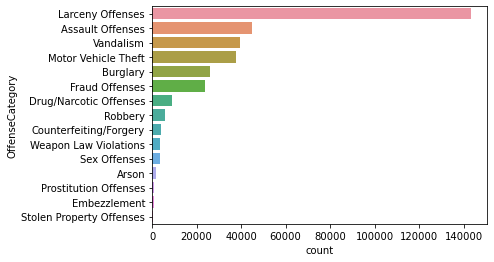

In [4]:
ax = sns.countplot(y="OffenseCategory",data=clean_data, order=clean_data.OffenseCategory.value_counts().iloc[:15].index)

Most of the data consists of Larceny Crimes while assault and Vandalism crimes still form a large part of the dataset. I.e, theft of propery and belongings form a significant chunk of the crime, which we also expect to be affected by night lighting.
Assault offences, which often occur in combination with offenses such as buglary, robbery and sex offenses, are also conventionally associated with 'occuring in the dark'.

## Historical Plot of Crime Data

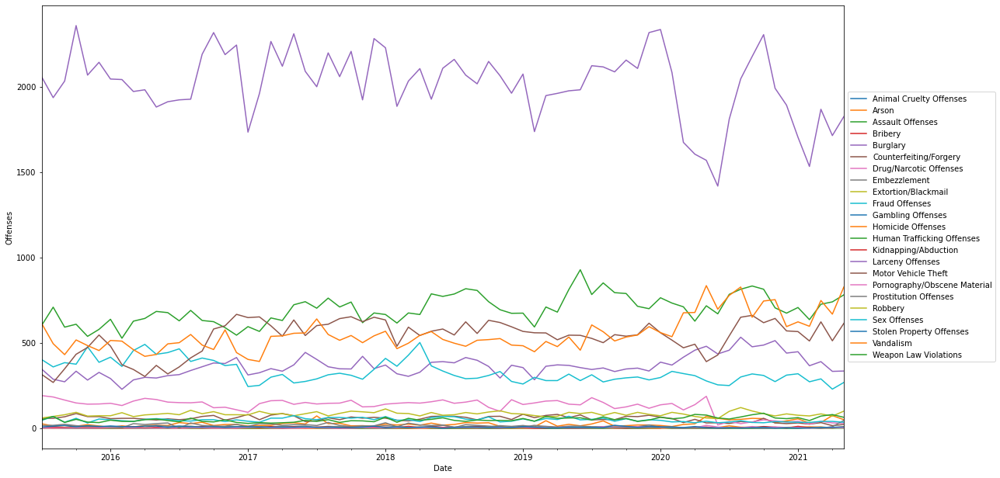

In [5]:
fig, ax = plt.subplots()

clean_data_crime=clean_data.groupby(['OccurMonth_Year','OffenseCategory']).OffenseCount.sum().reset_index()
for label, grp in clean_data_crime.groupby('OffenseCategory'):
    grp.plot(x = "OccurMonth_Year", y = "OffenseCount",ax = ax, label = label,)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    fig.set_size_inches(18.5, 10.5)
    ax.set_xlabel('Date')
    ax.set_ylabel('Offenses')

# Time Distribution of Crimes in Portland

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


(<Figure size 900x244.8 with 3 Axes>,
 array([<AxesSubplot:ylabel='2018'>, <AxesSubplot:ylabel='2019'>],
       dtype=object))

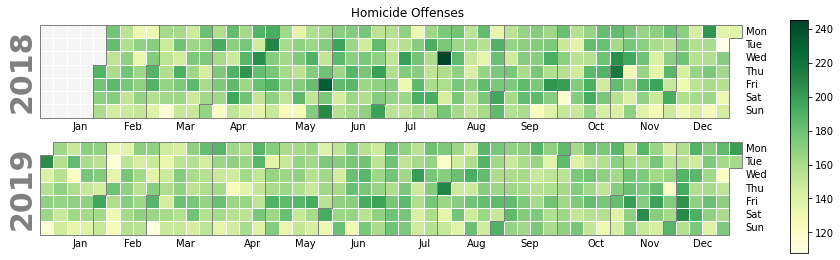

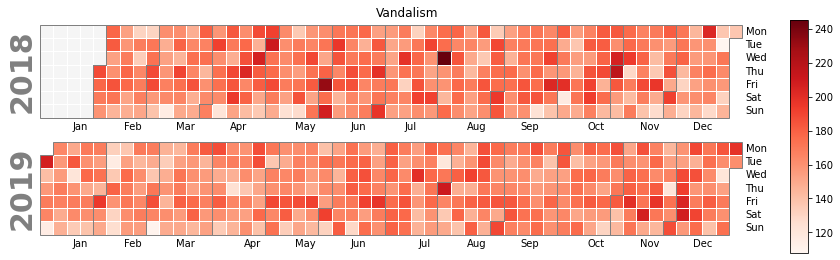

In [6]:
clean_data_calplot=clean_data.set_index('OccurDate')
clean_data_calplot= clean_data_calplot[clean_data_calplot.OccurMonth_Year>"2018-01-01"]
clean_data_calplot= clean_data_calplot[clean_data_calplot.OccurMonth_Year<"2020-01-01"]
clean_data_calplot_motor_theft= clean_data_calplot[clean_data_calplot.OffenseCategory=="Motor Vehicle Theft"]        
#calplot.calplot(clean_data_calplot['OffenseCount'])


clean_data_calplot_motor_theft= clean_data_calplot[clean_data_calplot.OffenseCategory=="Homicide Offenses"]       
calplot.calplot(clean_data_calplot['OffenseCount'], cmap='YlGn',suptitle="Homicide Offenses")


clean_data_calplot_vandalism= clean_data_calplot[clean_data_calplot.OffenseCategory=="Vandalism"]       
calplot.calplot(clean_data_calplot['OffenseCount'], cmap='Reds',suptitle="Vandalism")

There appears to be no directly visible correlation between months of occurence and crimes excluding the spike in crimes in December of Homicide and vandalism. This has been studied to be a common occurence historically in the United States.

# Graphing Night vs Day Crimes

As our project relies on analyzing the impact of night-time brightness on crime, we first need to examine the average crime-load across time. This can be analyzed by plotting crime spikes across time, for specific crime types and for all crimes seperately.

In [7]:

clean_data_day_night= clean_data.groupby(['OccurTime']).OffenseCount.sum().reset_index()
clean_data_day_night['OffenseCount']  = (clean_data_day_night['OffenseCount'] /clean_data_day_night['OffenseCount'].sum()) * 100

clean_data_day_night['day_or_night'] = np.where(((clean_data_day_night['OccurTime']<700) | (clean_data_day_night['OccurTime']>2000)), 'night', 'day')
clean_data_day_night= clean_data_day_night.pivot_table(index=["OccurTime"], 
                    columns='day_or_night', 
                    values='OffenseCount').reset_index()
clean_data_day_night= clean_data_day_night.fillna(0)
clean_data_day_night['night']=-clean_data_day_night['night']
#clean_data_day_night['day_or_night'] = np.where((clean_data_day_night['OccurTime']>2000), 'night', 'day')
clean_data_day_night['night_square']=2*clean_data_day_night['night']
#clean_data_day_night.groupby(['day_or_night']).OffenseCount.sum().reset_index()


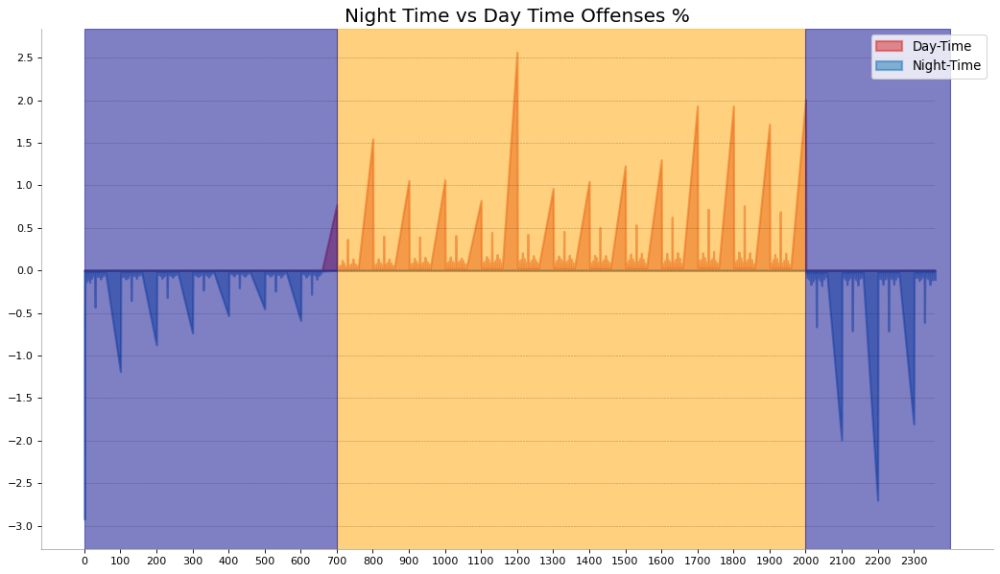

In [8]:
#datetime.datetime.strptime(clean_data_day_night['OccurTime'],'%H%M')

x = clean_data_day_night['OccurTime'].values.tolist()
y1 = clean_data_day_night['day'].values.tolist()
y2 = clean_data_day_night['night'].values.tolist()
mycolors = ['tab:blue', 'tab:red', 'tab:green', 'tab:orange', 'tab:brown', 'tab:grey', 'tab:pink', 'tab:olive']      
columns = ['Night-Time', 'Day-Time']

# Draw Plot 
fig, ax = plt.subplots(1, 1, figsize=(16,9), dpi= 80)
ax.fill_between(x, y1=y1, y2=0, label=columns[1], alpha=0.5, color=mycolors[1], linewidth=2)
ax.fill_between(x, y1=y2, y2=0, label=columns[0], alpha=0.5, color=mycolors[0], linewidth=2)

# Decorations
ax.set_title('Night Time vs Day Time Offenses %', fontsize=18)
#ax.set(ylim=[0, 30])
ax.legend(loc='best', fontsize=12)
plt.xticks(x[::60], fontsize=10, horizontalalignment='center')
plt.yticks(np.arange(-3, 3, 0.5), fontsize=10)
#plt.xlim(-10, x[-1])

# Draw Tick lines  
for y in np.arange(-3, 3, 0.5):    
    plt.hlines(y, xmin=0, xmax=2359, colors='black', alpha=0.3, linestyles="--", lw=0.5)
    
ax.axvspan(700, 2000, alpha=0.5, color='orange')
ax.axvspan(0, 700, alpha=0.5, color='darkblue')
ax.axvspan(2000, 2400, alpha=0.5, color='darkblue')
# Lighten borders
plt.gca().spines["top"].set_alpha(0)
plt.gca().spines["bottom"].set_alpha(.3)
plt.gca().spines["right"].set_alpha(0)
plt.gca().spines["left"].set_alpha(.3)
plt.show()

In [9]:


clean_data_day_night= clean_data.groupby(['OccurTime','OffenseCategory']).OffenseCount.sum().reset_index()
clean_data_day_night= clean_data_day_night[(clean_data_day_night.OffenseCategory=="Motor Vehicle Theft") | (clean_data_day_night.OffenseCategory=="Assault Offenses") | (clean_data_day_night.OffenseCategory=="Prostitution Offenses")| (clean_data_day_night.OffenseCategory=="Homicide Offenses")] 



clean_data_day_night= clean_data_day_night.pivot_table(index=["OccurTime"], 
                    columns='OffenseCategory', 
                    values='OffenseCount').reset_index()

clean_data_day_night['day_or_night'] = np.where(((clean_data_day_night['OccurTime']<700) | (clean_data_day_night['OccurTime']>2000)), 'night', 'day')

#clean_data_day_night= clean_data_day_night.pivot_table(index=["OccurTime","OffenseCategory"], 
                    #columns='day_or_night', 
                    #values=['Assault Offenses','Homicide Offenses','Motor Vehicle Theft','Prostitution Offenses']).reset_index()
clean_data_day_night= clean_data_day_night.fillna(0)
offences = ['Assault Offenses','Motor Vehicle Theft','Prostitution Offenses']

for i in offences:
    clean_data_day_night[i]=(clean_data_day_night[i] /clean_data_day_night[i].sum()) * 100
    clean_data_day_night[i]=np.where(clean_data_day_night['day_or_night']=="night",-1*clean_data_day_night[i],clean_data_day_night[i])


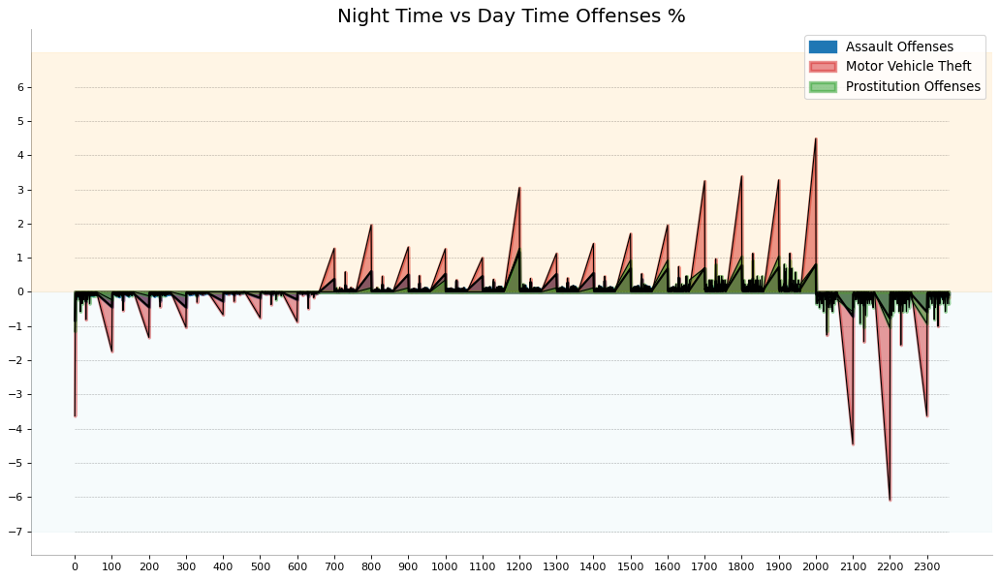

In [10]:
#datetime.datetime.strptime(clean_data_day_night['OccurTime'],'%H%M')

x = clean_data_day_night['OccurTime'].values.tolist()
y1 = clean_data_day_night['Assault Offenses'].values.tolist()
y2 = clean_data_day_night['Motor Vehicle Theft'].values.tolist()
y3 = clean_data_day_night['Prostitution Offenses'].values.tolist()

mycolors = ['tab:blue', 'tab:red', 'tab:green', 'tab:orange', 'tab:brown', 'tab:grey', 'tab:pink', 'tab:olive']      
columns = ['Assault Offenses', 'Motor Vehicle Theft','Prostitution Offenses']

# Draw Plot 
fig, ax = plt.subplots(1,1, figsize=(16,9), dpi= 80)
ax.plot(x, y1, label="",color='black', linewidth=2)
ax.plot(x, y2, label="",color='black', linewidth=1)
ax.plot(x, y3, label="",color='black', linewidth=1)
ax.fill_between(x, y1=y1, y2=0, label=columns[0], alpha=1, edgecolor='black',color=mycolors[0], linewidth=3)
ax.fill_between(x, y1=y2, y2=0, label=columns[1], alpha=0.5, edgecolor='black',color=mycolors[1], linewidth=3)
ax.fill_between(x, y1=y3, y2=0, label=columns[2], alpha=0.5, edgecolor='black',color=mycolors[2], linewidth=3)

# Decorations
ax.set_title('Night Time vs Day Time Offenses %', fontsize=18)
#ax.set(ylim=[0, 30])
ax.legend(loc='best', fontsize=12)
plt.xticks(x[::60], fontsize=10, horizontalalignment='center')
plt.yticks(np.arange(-7, 7, 1), fontsize=10)
#plt.xlim(-10, x[-1])

# Draw Tick lines  
for y in np.arange(-7, 7, 1):    
    plt.hlines(y, xmin=0, xmax=2359, colors='black', alpha=0.3, linestyles="--", lw=0.5)
    
ax.axhspan(0,7, alpha=0.1, color='orange')
ax.axhspan(0,-7, alpha=0.1, color='lightblue')
#ax.axhspan(0, 700, alpha=0.5, color='darkblue')
#ax.axvspan(2000, 2400, alpha=0.5, color='darkblue')
# Lighten borders
plt.gca().spines["top"].set_alpha(0)
plt.gca().spines["bottom"].set_alpha(.3)
plt.gca().spines["right"].set_alpha(0)
plt.gca().spines["left"].set_alpha(.3)

#plt.axvline(x=2000)
#plt.axvline(x=700)
plt.show()





Crimes Occur significantly more during night on average than during the day, agreeing with conventional wisdom and statistics published by the NIJ. This could be due to perceived lack of witnesses, reduced police presnse, or more importantly, the ability to remain anonymous in the dark. This allows us reasonable evidence to extend this analysis to a regression framework to examine the impact of night light on crime.

## Introducing Controls for Heterogentity between counties

In [11]:

df_with_controls_all=pd.read_csv("data/df_with_controls_alldaylong.csv")
df_with_controls=pd.read_csv("data/df_with_controls_nighttime.csv")

To control for other neighborhood characteristics,we control for many other variables including:
    
**Real Estate** :
2017 data from the Regional Multiple Listing Service with analysis by the Center for Spatial Analysis and Research at Portland State University’s Department of Geography. Figures were rounded for legibility.

**People** :
Data from the US Census Bureau’s American Community Survey 5-Year Estimates, released December 2017. The ACS data are estimates only and accuracy varies by attribute.

**Rent Costs** :
Calculated from all renter-occupied units, estimated median rent is not adjusted for unit size or number of occupants. Figure includes estimated monthly utility costs.

**Median Income** :
The Census defines household as including “all the persons who occupy a housing unit as their usual place of residence.” Thus this estimate includes living situations ranging from individuals to large households.
    
**Transit** :
Portland 2017 data from TriMet. Suburban transit information was sourced from TriMet as well as other services, including CC Rider, C-TRAN, Canby Area Transit, Yamhill County Transit Area, and South Metro Area Regional Transit.

**Minutes by Car to Downtown** :
Google Maps estimate, based on non–rush hour conditions, from a neighborhood/suburb central point to Pioneer Courthouse Square.

**Walk Score** :
2017 data from Walkscore.com. This score reflects, on a scale of 1 to 100, a neighborhood’s pedestrian-friendliness based on distances to amenities such as grocery stores and other routine destinations.    

**People below federal poverty level** :
People below the federal poverty level as decided for the financial year.



**Unemployed (16 years or older)** :
Those unemployed for a majority of the year as %.


**Total Newcomers (%)** :
Percentage of newcomers in the city (i.e,migrants who move to work or live)

In [12]:
df_with_controls.head()

,Unnamed: 0,index,Neighborhood,OccurMonth_Year,Matched_Names,Animal Cruelty Offenses,Arson,Assault Offenses,Bribery,Burglary,...,total_newcomers_perc,x.1,parks_perc,x.2,commute_by_public_transit,commute_by_bike_perc,commute_by_walking_perc,commute_biking_walking_perc,miles_bike_route_per_sqkm,walk_score
0,0,0,ALAMEDA,2015-07,ALAMEDA,0.0,0.0,0.0,0.0,1.0,...,5.4,0,0,13,8.6,12.2,3.3,15.5,1.24,65
1,1,1,ALAMEDA,2015-08,ALAMEDA,0.0,0.0,0.0,0.0,0.0,...,5.4,0,0,13,8.6,12.2,3.3,15.5,1.24,65
2,2,2,ALAMEDA,2015-09,ALAMEDA,0.0,0.0,0.0,0.0,0.0,...,5.4,0,0,13,8.6,12.2,3.3,15.5,1.24,65
3,3,3,ALAMEDA,2015-10,ALAMEDA,0.0,0.0,0.0,0.0,2.0,...,5.4,0,0,13,8.6,12.2,3.3,15.5,1.24,65
4,4,4,ALAMEDA,2015-11,ALAMEDA,0.0,0.0,0.0,0.0,0.0,...,5.4,0,0,13,8.6,12.2,3.3,15.5,1.24,65


## Evaluating the Impact of the Corona Pandemic in Portland on Crime Activity

In [13]:
## Impact of the first covid-occurence in Portland on crime through day and night


In [14]:
n_month_crime_with_brightness=df_with_controls_all


n_month_crime_with_brightness['First_Lockdown']=0
n_month_crime_with_brightness.loc[(n_month_crime_with_brightness['OccurMonth_Year']>="2020-03") & (n_month_crime_with_brightness['OccurMonth_Year']<="2020-07"),'First_Lockdown'] =1
n_month_crime_with_brightness[n_month_crime_with_brightness['commute_by_walking_perc'].isnull()]

#n_month_crime_with_brightness['Total_Offenses']= np.log(n_month_crime_with_brightness['Total_Offenses'])
#n_month_crime_with_brightness['median_household_income']= np.log(n_month_crime_with_brightness['median_household_income'])

np.seterr(divide = 'ignore')

n_month_crime_with_brightness['log_median_household_income']=  np.where(n_month_crime_with_brightness['median_household_income']>0,np.log(n_month_crime_with_brightness['median_household_income']), 0)
n_month_crime_with_brightness['log_Total_Offenses'] = np.where(n_month_crime_with_brightness['Total_Offenses']>0, np.log(n_month_crime_with_brightness['Total_Offenses']), 0)

ols_1 = sm.ols(formula='log_Total_Offenses ~ First_Lockdown',
                          data=n_month_crime_with_brightness).fit()
ols_2 =  smf.mixedlm('log_Total_Offenses ~ First_Lockdown',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_3 =  smf.mixedlm('log_Total_Offenses ~ First_Lockdown  + log_median_household_income',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_4 =  smf.mixedlm('log_Total_Offenses ~ First_Lockdown + log_median_household_income + people_below_poverty',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_5 =  smf.mixedlm('log_Total_Offenses ~ First_Lockdown + log_median_household_income + unemployed_perc + people_below_poverty',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_6 =  smf.mixedlm('log_Total_Offenses ~ First_Lockdown + log_median_household_income + unemployed_perc + people_below_poverty + perc_diff_state_last_year + total_newcomers_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()


ols_7 =  smf.mixedlm('log_Total_Offenses ~ First_Lockdown + log_median_household_income + unemployed_perc + people_below_poverty + perc_diff_state_last_year + total_newcomers_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_8 =  smf.mixedlm('log_Total_Offenses ~ First_Lockdown + log_median_household_income + unemployed_perc + people_below_poverty +  perc_diff_state_last_year + commute_by_walking_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()




reg1 = ols_1
reg2 = ols_2
reg3 = ols_3
reg4 = ols_4
reg5 = ols_5
reg6 = ols_6
reg7 = ols_7
reg8 = ols_8


results = summary_col([reg1, reg2, reg3, reg4,reg5,reg6,reg7,reg8],stars=True,float_format='%0.2f',
                  model_names=['Model\n(1)', 'Model\n(2)', 'Model\n(3)',  'Model\n(4)', 
                               'Model\n(5)',  'Model\n(6)',  'Model\n(7)' , 'Model\n(8)'],
                  info_dict={'N':lambda x: "{0:d}".format(int(x.nobs)),
                             'R2':lambda x: "{:.2f}".format(x.rsquared)})
results



,Model,Model,Model,Model,Model,Model,Model,Model
,(1),(2),(3),(4),(5),(6),(7),(8)
First_Lockdown,-0.03,-0.03**,-0.03**,-0.03**,-0.03**,-0.03**,-0.03**,-0.03**
,(0.06),(0.02),(0.02),(0.02),(0.02),(0.02),(0.02),(0.02)
Group Var,,12.47***,6.34***,6.36***,6.42***,6.08***,6.08***,6.51***
,,(1.84),(0.94),(0.95),(0.97),(0.93),(0.93),(0.99)
Intercept,3.33***,3.28***,30.88***,26.87***,26.95***,27.15***,27.15***,28.07***
,(0.02),(0.13),(2.90),(5.30),(5.36),(5.36),(5.36),(5.53)
R-squared,0.00,,,,,,,
R-squared Adj.,-0.00,,,,,,,
commute_by_walking_perc,,,,,,,,0.01


In [15]:
pd.options.mode.chained_assignment = None 
n_month_crime_with_brightness=df_with_controls

n_month_crime_with_brightness=n_month_crime_with_brightness[n_month_crime_with_brightness['Average Radiance Per Pixel Per month'].notnull()]


np.seterr(divide = 'ignore')
n_month_crime_with_brightness['log_median_household_income']=  np.where(n_month_crime_with_brightness['median_household_income']>0,np.log(n_month_crime_with_brightness['median_household_income']), 0)
n_month_crime_with_brightness['log_Total_Offenses'] = np.where(n_month_crime_with_brightness['Total_Offenses']>0, np.log(n_month_crime_with_brightness['Total_Offenses']), 0)
n_month_crime_with_brightness['log_brightness'] = np.where(n_month_crime_with_brightness['Average Radiance Per Pixel Per month']>0, np.log(n_month_crime_with_brightness['Average Radiance Per Pixel Per month']), 0)
n_month_crime_with_brightness['night_brightness'] = n_month_crime_with_brightness['Average Radiance Per Pixel Per month']





In [16]:

ols_1 = sm.ols(formula='log_Total_Offenses ~ night_brightness-1',
                          data=n_month_crime_with_brightness).fit()

ols_2 =  smf.mixedlm('log_Total_Offenses ~ night_brightness-1',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_3 =  smf.mixedlm('log_Total_Offenses ~ night_brightness-1  + log_median_household_income',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_4 =  smf.mixedlm('log_Total_Offenses ~ night_brightness-1 + log_median_household_income + people_below_poverty',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_5 =  smf.mixedlm('log_Total_Offenses ~ night_brightness-1 + log_median_household_income + unemployed_perc + people_below_poverty',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_6 =  smf.mixedlm('log_Total_Offenses ~ night_brightness-1 + log_median_household_income + unemployed_perc + people_below_poverty + perc_diff_state_last_year + total_newcomers_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()


ols_7 =  smf.mixedlm('log_Total_Offenses ~ night_brightness-1 + log_median_household_income + unemployed_perc + people_below_poverty + perc_diff_state_last_year + total_newcomers_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_8 =  smf.mixedlm('log_Total_Offenses ~ night_brightness-1 + log_median_household_income + unemployed_perc + people_below_poverty +  perc_diff_state_last_year + commute_by_walking_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_9 =  smf.mixedlm('log_Total_Offenses ~ log_brightness-1 + log_median_household_income + unemployed_perc + people_below_poverty',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_10 =  smf.mixedlm('log_Total_Offenses ~ log_brightness-1 + log_median_household_income + unemployed_perc + people_below_poverty + perc_diff_state_last_year + total_newcomers_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()


ols_11=  smf.mixedlm('log_Total_Offenses ~ log_brightness-1 + log_median_household_income + unemployed_perc + people_below_poverty + perc_diff_state_last_year + total_newcomers_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

ols_12 =  smf.mixedlm('log_Total_Offenses ~ log_brightness-1 + log_median_household_income + unemployed_perc + people_below_poverty +  perc_diff_state_last_year + commute_by_walking_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()




reg1 = ols_1
reg2 = ols_2
reg3 = ols_3
reg4 = ols_4
reg5 = ols_5
reg6 = ols_6
reg7 = ols_7
reg8 = ols_8
reg9 = ols_9
reg10 = ols_10
reg11 = ols_11
reg12 = ols_12

results = summary_col([reg1, reg2, reg3, reg4,reg5,reg6,reg7,reg8,reg9,reg10,reg11,reg12],stars=True,float_format='%0.2f',
                  model_names=['Model\n(1)', 'Model\n(2)', 'Model\n(3)',  'Model\n(4)', 
                               'Model\n(5)',  'Model\n(6)',  'Model\n(7)' , 'Model\n(8)', 'Model\n(9)', 'Model\n(10)'
                              , 'Model\n(11)', 'Model\n(12)'],
                  info_dict={'N':lambda x: "{0:d}".format(int(x.nobs)),
                             'R2':lambda x: "{:.2f}".format(x.rsquared)})
results


,Model,Model,Model,Model,Model,Model,Model,Model,Model,Model,Model,Model
,(1),(2),(3),(4),(5),(6),(7),(8),(9),(10),(11),(12)
Group Var,,42.66***,8.78***,4.82***,4.87***,4.62***,4.62***,4.97***,4.99***,4.73***,4.73***,5.09***
,,(6.32),(1.31),(0.72),(0.73),(0.70),(0.70),(0.76),(0.75),(0.72),(0.72),(0.78)
R-squared,0.74,,,,,,,,,,,
R-squared Adj.,0.74,,,,,,,,,,,
commute_by_walking_perc,,,,,,,,0.01,,,,0.00
,,,,,,,,(0.02),,,,(0.02)
log_brightness,,,,,,,,,-0.10***,-0.10***,-0.10***,-0.10***
,,,,,,,,,(0.03),(0.03),(0.03),(0.03)
log_median_household_income,,,0.22***,0.08***,0.09***,0.10***,0.10***,0.09***,0.11***,0.12***,0.12***,0.11***


### Exploring the relationship betweeen night brightness and crime

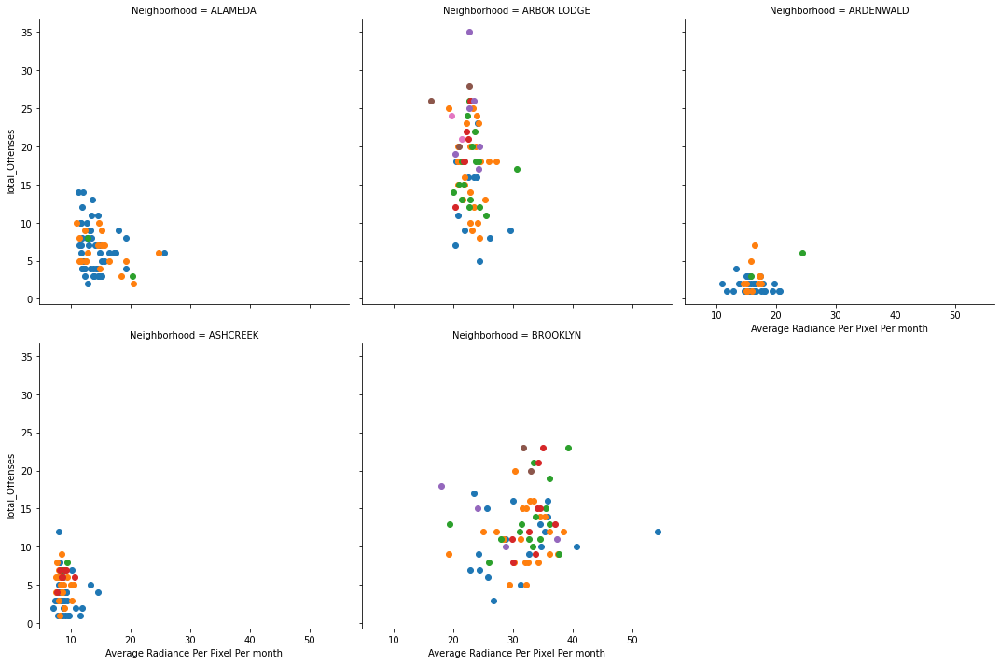

In [17]:
n_month_brightness_crime=pd.read_csv("df_with_controls_nighttime.csv")
k= pd.to_datetime(n_month_brightness_crime['OccurMonth_Year'])
n_month_brightness_crime['Year']=k.dt.year
Neighborhoods = ["ALAMEDA","ARBOR LODGE","ARDENWALD","ASHCREEK","BROOKLYN","BROOKLYN"]
n_month_brightness_crime_plot= n_month_brightness_crime[n_month_brightness_crime.Neighborhood.isin(Neighborhoods)]
g = sns.FacetGrid(n_month_brightness_crime_plot, col="Neighborhood",hue='Assault Offenses', height=5,col_wrap=3,)
g.map(plt.scatter, 'Average Radiance Per Pixel Per month', 'Total_Offenses')




In [18]:
corr_df=n_month_brightness_crime[['Bribery', 'Burglary', 'Counterfeiting/Forgery',  'Drug/Narcotic Offenses' ,'Homicide Offenses'
                                  ,  'Fraud Offenses', 'Human Trafficking Offenses', 'Kidnapping/Abduction','Prostitution Offenses',
                                      'Vandalism','median_home_price','median_household_income','unemployed_perc',
                                  'Arson','Average Radiance Per Pixel Per month']]

corr =corr_df.corr()
corr.style.background_gradient(cmap='coolwarm')

,Bribery,Burglary,Counterfeiting/Forgery,Drug/Narcotic Offenses,Homicide Offenses,Fraud Offenses,Human Trafficking Offenses,Kidnapping/Abduction,Prostitution Offenses,Vandalism,median_home_price,median_household_income,unemployed_perc,Arson,Average Radiance Per Pixel Per month
Bribery,1.000000,0.006958,0.011887,0.024042,-0.004315,0.042845,-0.001794,0.022738,0.017678,0.030725,-0.019948,-0.029938,0.051649,0.022508,0.043651
Burglary,0.006958,1.000000,0.192457,0.243870,0.098311,0.308574,0.033267,0.108352,0.093617,0.613619,-0.163135,-0.319936,0.238032,0.367282,0.245880
Counterfeiting/Forgery,0.011887,0.192457,1.000000,0.339207,0.075485,0.350453,-0.001355,0.101746,0.112115,0.273196,-0.171974,-0.212373,0.193864,0.077493,0.175700
Drug/Narcotic Offenses,0.024042,0.243870,0.339207,1.000000,0.085872,0.406547,0.032411,0.144952,0.142158,0.378127,-0.273800,-0.295664,0.285811,0.155093,0.359939
Homicide Offenses,-0.004315,0.098311,0.075485,0.085872,1.000000,0.067109,0.007578,0.018202,0.099941,0.147137,-0.087231,-0.096594,0.082973,0.062212,0.065751
Fraud Offenses,0.042845,0.308574,0.350453,0.406547,0.067109,1.000000,0.042980,0.110933,0.173324,0.399715,-0.222811,-0.283374,0.248537,0.159625,0.288690
Human Trafficking Offenses,-0.001794,0.033267,-0.001355,0.032411,0.007578,0.042980,1.000000,0.029232,0.035494,0.043695,-0.036135,-0.037017,0.038311,0.009624,0.011059
Kidnapping/Abduction,0.022738,0.108352,0.101746,0.144952,0.018202,0.110933,0.029232,1.000000,0.034881,0.141902,-0.088946,-0.111469,0.103875,0.052654,0.092988
Prostitution Offenses,0.017678,0.093617,0.112115,0.142158,0.099941,0.173324,0.035494,0.034881,1.000000,0.140985,-0.096313,-0.106853,0.084088,0.036770,0.104732
Vandalism,0.030725,0.613619,0.273196,0.378127,0.147137,0.399715,0.043695,0.141902,0.140985,1.000000,-0.238808,-0.381537,0.381356,0.482603,0.402762


## Call for Service Data

In [19]:
import folium
from folium.plugins import FastMarkerCluster
import geopandas
from geopandas.tools import sjoin
#from shapely.geometry import Point, Polygon
#import geoplot as gplty
from shapely.geometry import Point, Polygon
from geopandas import GeoDataFrame, GeoSeries

We will know import the call for service data. This allows us to expand our analysis to different variables, including response time at a geo spatial level. The NIJ Real-Time Crime Forecasting dataset consists of 958,499 calls for service records from the Portland Police Bureau (PPB), representing calls to Portland’s 911 system requesting police ssistance from March 1st, 2012 through February 28th, 2017. As shown in
The four categories of crime, which themselves varied in the degree of internal heterogeneity, included burglary (burglary and prowling), sreet crime (ranging from disturbance and threats up to armed robbery and assault with a Firearm), theft of auto, and all calls for service

This allows us to apply both forecasting models as well as Optimal rotational grid PAI maximizing methodology to predict both crime as well as response rates In particular, we assume a grid of equally sized rectangles and fix the grid vell size to be the minimum allowed in the competition, Amin. We then parametrize the grid with three parameters: cell height h, a grid translation parameter γ and a rotation angle θ. The overall procedure is captured in Algorithm 1.


In [20]:

cwd = os.getcwd()
files = os.listdir("data/call_for_service_data/excel_sheets_call_for_service")
prefix='DispatchedCalls'
file= list(filter(lambda file: file.startswith(prefix),files))

df = []
for f in file:
         csv_file="data/call_for_service_data/excel_sheets_call_for_service"+ "/" + f
         print(csv_file)
         df.append(pd.read_excel(csv_file))
         df_call_data = pd.concat(df, ignore_index=True)
df_call_data =df_call_data [df_call_data ['OpenDataLon'].notnull()]
portland_pol_districs= geopandas.read_file('data/police_districts_portland\Portland_Police_Districts.dbf')

data/call_for_service_data/excel_sheets_call_for_service/DispatchedCalls_OpenData_2019.xlsx


In [21]:
crs = {'init':'EPSG:4326'}
gdf = geopandas.GeoDataFrame(
    df_call_data, crs = crs, geometry=geopandas.points_from_xy(df_call_data['OpenDataLon'], df_call_data['OpenDataLat']))

C:\Users\abrah\anaconda3\envs\space_farers\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


#### Visualizing the Call for Service Data for Portland based on prirority level

The map below demonstrates the call for service data as a map with the priroirty levels. High Priority level crimes are mostly centered in the more populated central district of Portland

In [22]:
map = folium.Map(location=[ df_call_data.OpenDataLat.mean(),  df_call_data.OpenDataLon.mean()], zoom_start=14, control_scale=True)


#for index, call in df_call_data.iterrows():
    #folium.Marker([call["OpenDataLat"],call["OpenDataLon"]], popup=call["FinalCallCategory"]).add_to(map)
    
map.add_child(FastMarkerCluster(df_call_data[['OpenDataLat', 'OpenDataLon']].values.tolist()))
  

Text(50.25, 0.5, 'Latitude')

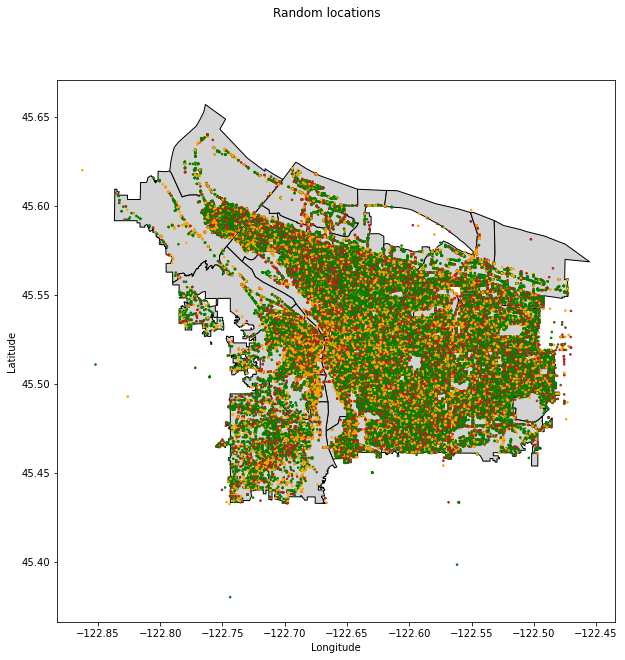

In [23]:
gdf= gdf[gdf['OpenDataLat']<45.65]
gdf= gdf[gdf['OpenDataLon']< -122.47]
gdf['colors']='firebrick'

points_symb = {'High': 'firebrick',
               'Medium': 'orange',
               'Low': 'green'}

fig, ax = plt.subplots(figsize = (10,10))
portland_pol_districs.to_crs(epsg=4326).plot(ax=ax, color='lightgrey', edgecolor='k',alpha=1,linewidth=1)
gdf.plot(ax=ax,color=gdf["Priority"].map(points_symb), markersize=2.5)
fig.suptitle('Random locations', fontsize=12)
ax.set_xlabel('Longitude', fontsize=10)
ax.set_ylabel('Latitude', fontsize='medium')
#ax.grid(linestyle='--')

#number_of_runs = range(1,1000)    # use your actual number_of_runs
#ax.set_xticks(number_of_runs, minor=False)
#ax.xaxis.grid(True, which='major')

Using more distinct geo-spatial visualization, we can observe crime at the street level,i.e concentrated on certain horitzontal and vertical paths.



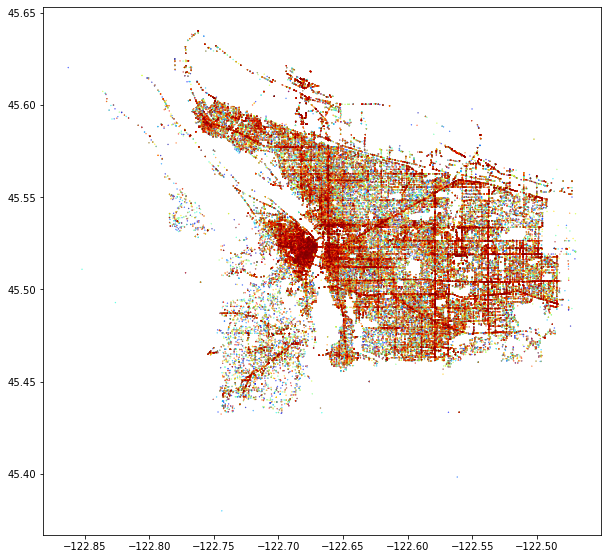

In [24]:

# total area for the grid
xmin, ymin, xmax, ymax= gdf.total_bounds
# how many cells across and down
n_cells=30
cell_size = (xmax-xmin)/n_cells
# projection of the grid
crs = "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"
# create the cells in a loop
grid_cells = []
for x0 in np.arange(xmin, xmax+cell_size, cell_size ):
    for y0 in np.arange(ymin, ymax+cell_size, cell_size):
        # bounds
        x1 = x0-cell_size
        y1 = y0+cell_size
        grid_cells.append( shapely.geometry.box(x0, y0, x1, y1)  )
        
cell = geopandas.GeoDataFrame(grid_cells, columns=['geometry'], 
                                 crs=crs)       


ax = gdf.plot(markersize=.1, figsize=(10,10), cmap='jet')

### Heatmap of Call for Service Locations

THe call for service call seem to be more or less evently districuted with the area around Industrial heights having a lower concentration of call for service.

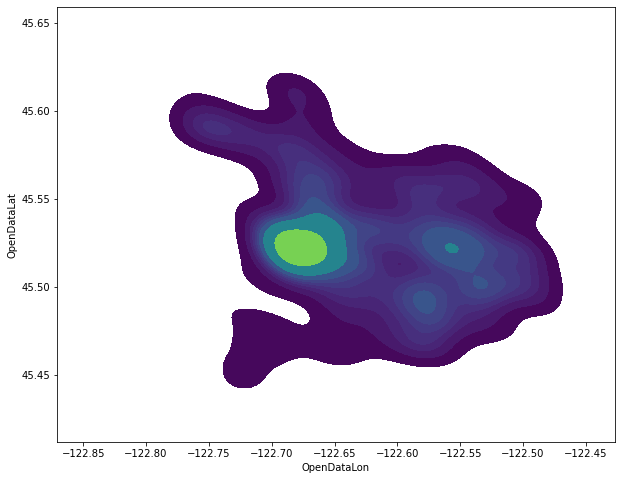

In [25]:
fig, ax = plt.subplots(figsize = (10,8))
gdf_kd=gdf.head(10000)
sns.kdeplot(x=gdf_kd['OpenDataLon'],y= gdf_kd['OpenDataLat'], shade=True, cmap='viridis');

## Constructing a Rotational Spatial Grid for maximizing accuracy in Crime Forecasts

We construct a grid-like structure over the map, assigning each call and details to each grid.This allows us to construct grid-level predicts for every single grid, and also use the grid-level feature averages to fit a Spatial Random Forest

The procedure $\mathrm{PAI}\left(h, \theta, \gamma, \bar{x}_{i}, t_{i}, \omega, A_{\min }\right)$

a. Set up Grid with cell heigh h,cell area $A_{\min }$, grid angle $\theta$.

b. Calculate event based features on grid using crime locations $\bar{x}_{i}$ and times $t_{i}$.

c. Fit a supervised model M, using tuning parameters w, on event features defined on the training set.

d. Predict M on test data features and output PAI.

(-122.88215795002691, -122.4505427254831, 45.36698919891764, 45.65317846044416)

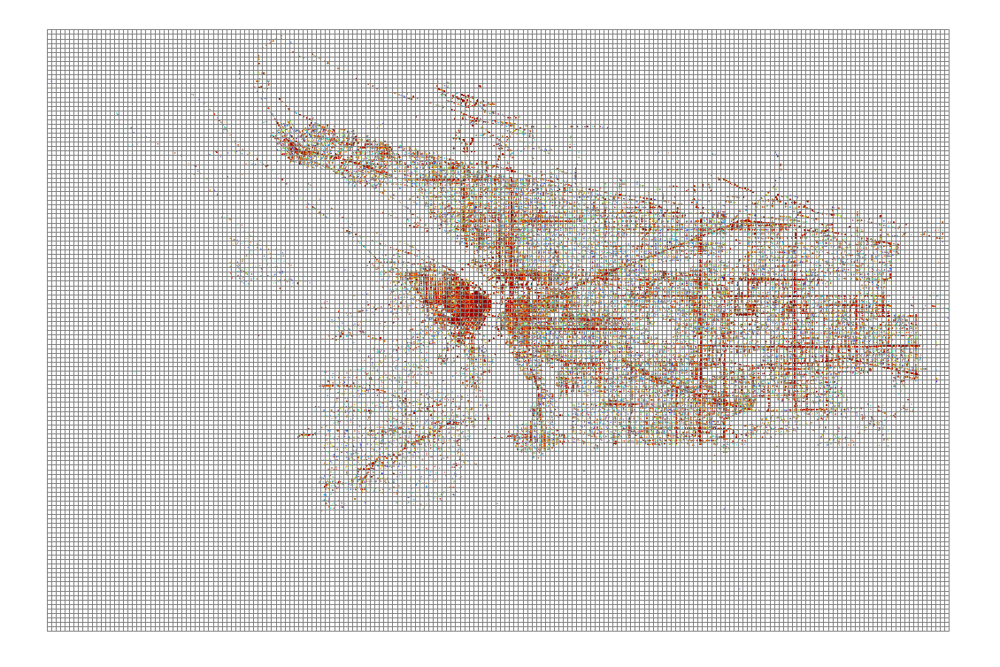

In [26]:

my_geoseries = gdf.set_crs("+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs",allow_override=True)

# total area for the grid
xmin, ymin, xmax, ymax= gdf.total_bounds
# how many cells across and down
n_cells=200
cell_size = (xmax-xmin)/n_cells
# projection of the grid
crs = "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"
# create the cells in a loop
grid_cells = []
for x0 in np.arange(xmin, xmax+cell_size, cell_size ):
    for y0 in np.arange(ymin, ymax+cell_size, cell_size):
        # bounds
        x1 = x0-cell_size
        y1 = y0+cell_size
        grid_cells.append( shapely.geometry.box(x0, y0, x1, y1)  )
        
cell = geopandas.GeoDataFrame(grid_cells, columns=['geometry'], 
                                 crs=crs)       


ax = my_geoseries.plot(markersize=.1, figsize=(20,20), cmap='jet')
plt.autoscale(False)
cell.plot(ax=ax, facecolor="none", edgecolor='grey',figsize=(20,20))
ax.axis("off")

In [27]:
merged = geopandas.sjoin(my_geoseries, cell, how='left', op='within')
merged['n_crimes']=1
# Compute stats per grid cell -- aggregate fires to grid cells with dissolve
dissolve = merged.dissolve(by="index_right", aggfunc="count")
# put this into cell
cell.loc[dissolve.index, 'n_crimes'] = dissolve.n_crimes.values
merged.to_csv("data/call_service_grid_data.csv", encoding='utf-8', index=False)


#### Visualization of Grid-level call for service levels in Portland City

(-122.87185804125934,
 -122.45103319733064,
 45.38549108639032,
 45.65309252560749)

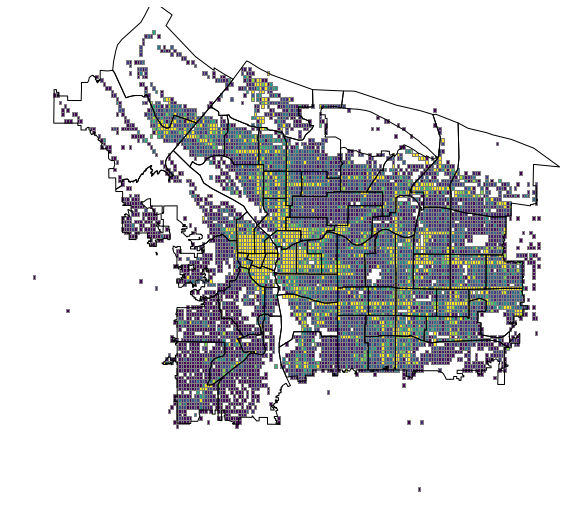

In [28]:
ax = cell.plot(column='n_crimes', figsize=(10,10), cmap='viridis', vmax=60, edgecolor="grey")
plt.autoscale(False)
portland_pol_districs.to_crs(epsg=4326).plot(ax=ax, figsize=(10,10), color='none', edgecolor='black')
ax.axis('off')


## GRID level Prediction error minimizing ARIMA Model

### Fitting an ARIMA Forecast on Grid-level Call for Service Data

ARIMA stands for Autoregressive Integrated Moving Average Model. It is a part of a class of models that allow us to predict a time series depending on it's past values. The prerequisite is that the time series be deaseasonalized, and any time series that exhibits patterns and is not random white noise can be modelled with ARIMA models.

**AR model**

An Auto Regressive (AR) model is one where Yt depends only on its own lags.


That is, Yt is a function of the lags of Yt. It is depicted by the following equation -



$Y_{t}=\alpha+\beta_{1} Y_{t-1}+\beta_{2} Y_{t-2}+. .+\beta_{p} Y_{t-p}+\epsilon_{1}$


where,

$Y_{t}$ is the lag1 of the series.


**ARIMA model**

An ARIMA model is one where the time series was differenced at least once to make it stationary and we combine the AR and the MA terms. So the equation of an ARIMA model becomes :




$Y_{t}=\alpha+\beta_{1} Y_{t-1}+\beta_{2} Y_{t-2}+. .+\beta_{p} Y_{t-p} \epsilon_{t}+\phi_{1} \epsilon_{t-1}+\phi_{2} \epsilon_{t-2}+. .+\phi_{q} \epsilon_{t-q}$.





For our purposes we will be using the  AUTO-Arime model my Parima.

Auto-Arima conducts difference tests (i.e., Kwiatkowski–Phillips–Schmidt–Shin, Augmented Dickey-Fuller or Phillips–Perron) to determine the order of differencing,and then fitting models. If the seasonal optional is enabled, auto-ARIMA also seeks to identify the optimal P and Q hyper- parameters after conducting the Canova-Hansen to determine the optimal order of seasonal differencing.

In [29]:

plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})


**Splitting the data into test and train for purposes of forecasting.**

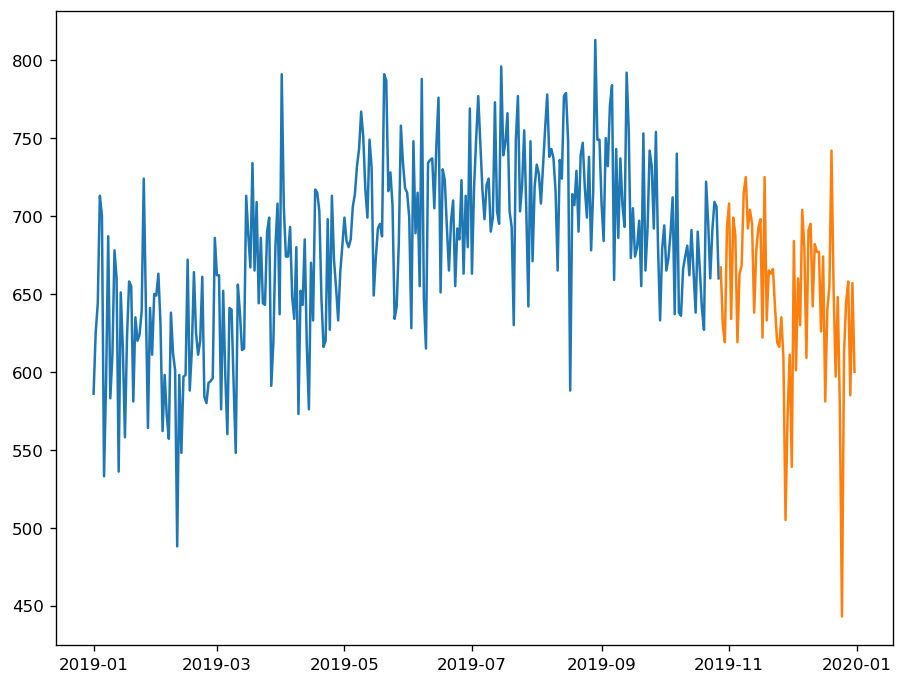

In [30]:

merged['Date'] = pd.to_datetime(merged['ReportDateTime']).dt.date
merged_month=merged.groupby(['Date']).n_crimes.sum().reset_index()
merged_month.set_index('Date', inplace=True)
train=merged_month[:300]
test=merged_month[-65:]
plt.plot(train)
plt.plot(test)


A stationary time series is one whose properties do not depend on the time at which the series is observed.14 Thus, time series with trends, or with seasonality, are not stationary — the trend and seasonality will affect the value of the time series at different times. On the other hand, a white noise series is stationary — it does not matter when you observe it, it should look much the same at any point in time.

Some cases can be confusing — a time series with cyclic behaviour (but with no trend or seasonality) is stationary. This is because the cycles are not of a fixed length, so before we observe the series we cannot be sure where the peaks and troughs of the cycles will be.

In general, a stationary time series will have no predictable patterns in the long-term. Time plots will show the series to be roughly horizontal (although some cyclic behaviour is possible), with constant variance.


In Figure 8.1, note that the Google stock price was non-stationary in panel (a), but the daily changes were stationary in panel (b). This shows one way to make a non-stationary time series stationary — compute the differences between consecutive observations. This is known as differencing.

Transformations such as logarithms can help to stabilise the variance of a time series. Differencing can help stabilise the mean of a time series by removing changes in the level of a time series, and therefore eliminating (or reducing) trend and seasonality. There are many different kinds of differencing; for example -


Second-order differencing (or higher)

$\begin{aligned} y_{t}^{\prime \prime} &=y_{t}^{\prime}-y_{t-1}^{\prime} \\ &=\left(y_{t}-y_{t-1}\right)-\left(y_{t-1}-y_{t-2}\right) \\ &=y_{t}-2 y_{t-1}+y_{t-2} . \end{aligned}$



Seasonal differencing

A seasonal difference is the difference between an observation and the previous observation from the same season. So where  
m = the number of seasons.


$y_{t}^{\prime}=y_{t}-y_{t-m}$


These are also called “lag-m differences,” as we subtract the observation after a lag of m periods.



#### Finding the optimum order of differencing:

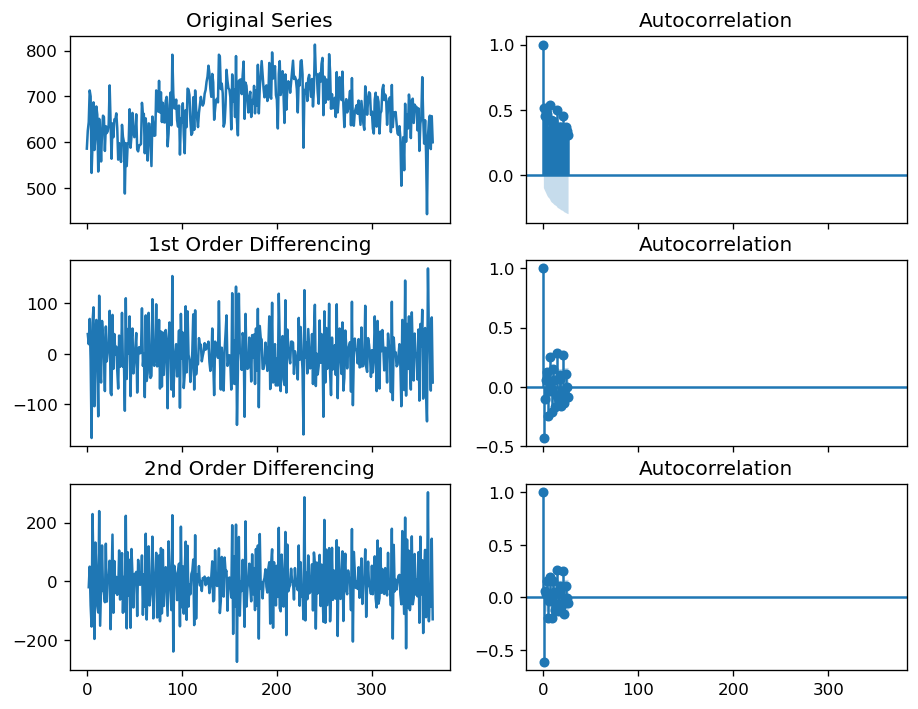

In [31]:
merged_month_diff = merged_month
merged_month_diff.index = np.arange(0, len(merged_month))



# Original Series
fig, axes = plt.subplots(3, 2, sharex=True)
axes[0, 0].plot(merged_month_diff.n_crimes); axes[0, 0].set_title('Original Series')
plot_acf(merged_month_diff.n_crimes, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(merged_month_diff.n_crimes.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(merged_month_diff.n_crimes.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(merged_month_diff.n_crimes.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(merged_month_diff.n_crimes.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

### Fitting a auto-arima model to the crime-call for service data at the grid-level

In [32]:
model=pm.auto_arima(train,start_p=0,d=1,start_q=0,
          max_p=5,max_d=5,max_q=5, start_P=0,
          D=1, start_Q=0, max_P=5,max_D=5,
          max_Q=5, m=1, seasonal=False,
          error_action='warn',trace=True,
          supress_warnings=True,stepwise=False,
          random_state=20,n_fits=50)

#https://towardsdatascience.com/efficient-time-series-using-pythons-pmdarima-library-f6825407b7f0


 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3255.222, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3107.834, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3107.667, Time=0.09 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3109.093, Time=0.12 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3110.927, Time=0.19 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=3111.442, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3197.079, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3107.905, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3111.074, Time=0.22 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3112.195, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3156.293, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3109.190, Time=0.11 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3111.905, Time=0.14 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3076.804, Time=0.49 sec
 ARIMA(3,1,0)(0

The model summary allows us to get key determinants of the accuracy of our model.The data inherent in the geo spatial nature of the call of service data is alone not sufficient to provide a accurate forecst. 

In [33]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  300
Model:               SARIMAX(2, 1, 3)   Log Likelihood               -1531.402
Date:                Wed, 26 Jan 2022   AIC                           3076.804
Time:                        00:54:00   BIC                           3102.707
Sample:                             0   HQIC                          3087.172
                                - 300                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.4035      0.915     -0.441      0.659      -2.197       1.390
ar.L1         -0.4465      0.009    -48.246      0.000      -0.465      -0.428
ar.L2         -0.9920      0.009   -105.424      0.000      -1.010      -0.974
ma.L1         -0.4145      0.046     -9.093      0.000      -0.504      -0.325
ma.L2          0.5799      0.040     14.398      0.000       0.501       0.659
ma.L3         -0.8179      0.044    -18.634      0.000      -0.904      -0.732
sigma2      1703.7782    144.898     11.758      0.000    1419.783    1987.773
===================================================================================
Ljung-Box (L1) (Q):                   2.93   Jarque-Bera (JB):                 1.66
Prob(Q):                              0.09   Prob(JB):                         0.44
Heteroskedasticity (H):               0.78   Skew:                            -0.12
Prob(H) (two-sided):                  0.22   Kurtosis:                         3.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

**Plotting prediction vs Test Values**

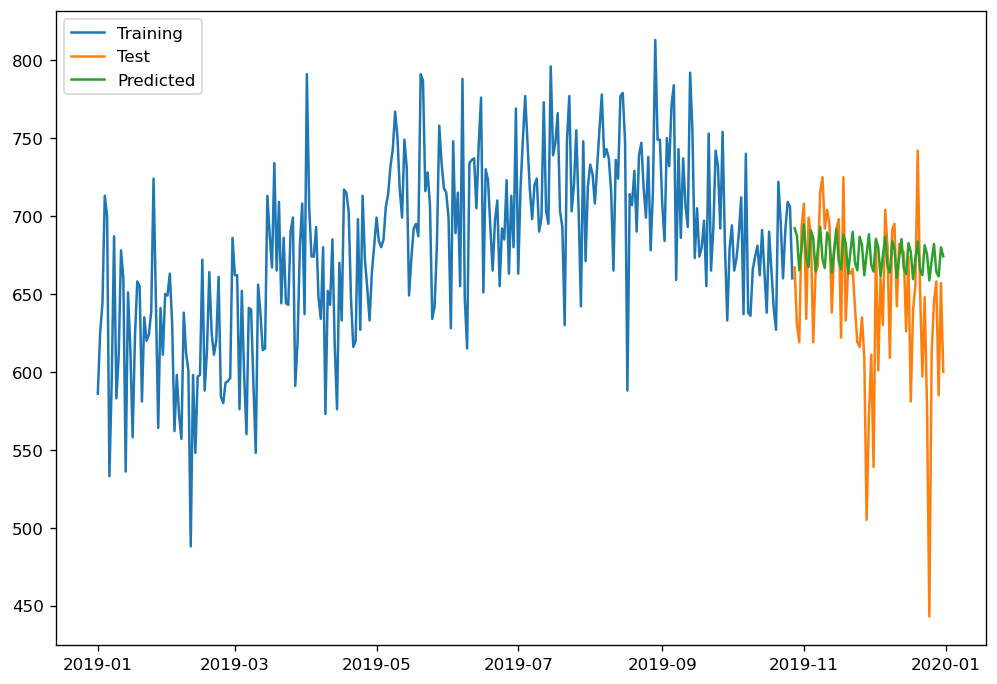

In [34]:
prediction = pd.DataFrame(model.predict(n_periods = 65),index=test.index)


prediction.columns = ['predicted_passengers']
plt.figure(figsize=(10,7))
plt.plot(train,label="Training")
plt.plot(test,label="Test")
plt.plot(prediction,label="Predicted")
plt.legend(loc = 'upper left')
plt.savefig('SecondPrection.jpg')
plt.show()

**Plotting the model diagnostics**

The “residuals” in a time series model are what is left over after fitting a model. For many (but not all) time series models, the residuals are equal to the difference between the observations and the corresponding fitted values:


Residuals are useful in checking whether a model has adequately captured the information in the data. A good forecasting method will yield residuals with the following properties:

The residuals are uncorrelated. If there are correlations between residuals, then there is information left in the residuals which should be used in computing forecasts.
The residuals have zero mean. If the residuals have a mean other than zero, then the forecasts are biased.
Any forecasting method that does not satisfy these properties can be improved. However, that does not mean that forecasting methods that satisfy these properties cannot be improved. It is possible to have several different forecasting methods for the same data set, all of which satisfy these properties. Checking these properties is important in order to see whether a method is using all of the available information, but it is not a good way to select a forecasting method.

If either of these properties is not satisfied, then the forecasting method can be modified to give better forecasts. Adjusting for bias is easy: if the residuals have mean m,then simply add m to all forecasts and the bias problem is solved.

C:\Users\abrah\anaconda3\envs\space_farers\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


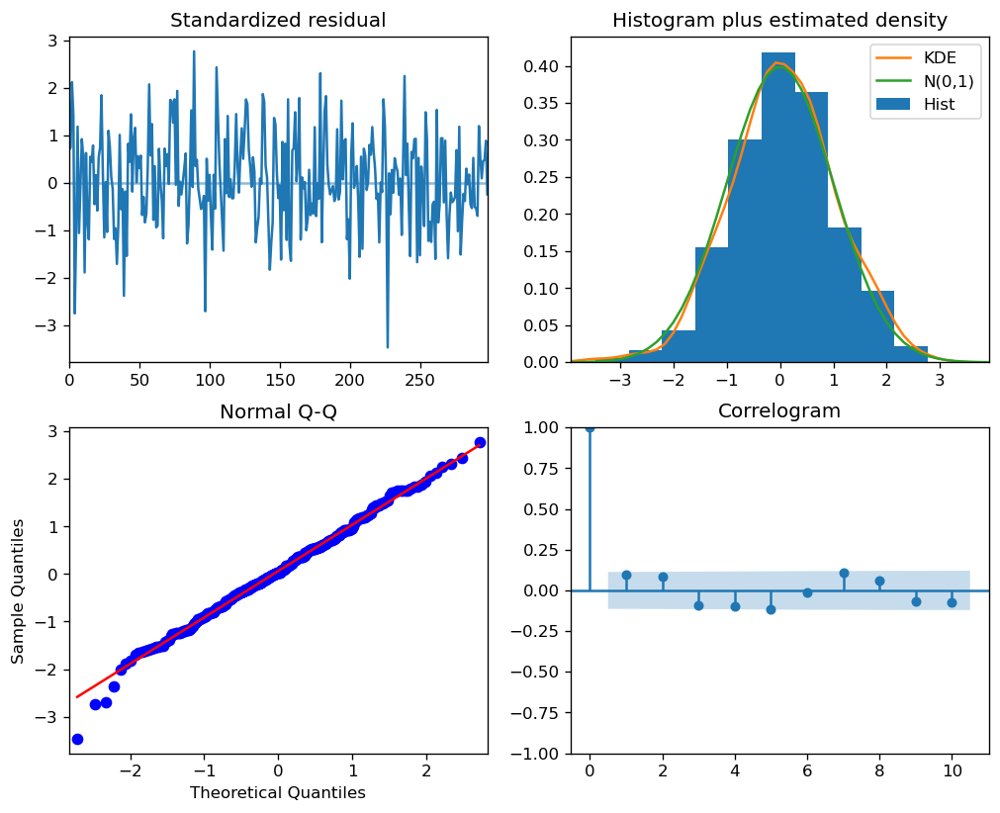

In [35]:
model.plot_diagnostics(figsize=(10,8))
plt.show()


gdf_traveltimes = gdf[gdf['ResponseTime_sec'] > 0]
gdf_traveltimes =gdf_traveltimes.head(50000)
fig, ax = plt.subplots(figsize = (10,10))
portland_pol_districs.to_crs(epsg=4326).plot(ax=ax, figsize=(10,10), color='lightgrey', edgecolor='k',alpha=1,linewidth=1,cmap="cividis")
gdf_traveltimes.plot(ax=ax, figsize=(10,10), column='ResponseTime_sec', scheme='Fisher_Jenks',
                         k=9, cmap='RdYlBu', linewidth=0)


fig.suptitle('Random locations', fontsize=12)
ax.set_xlabel('Longitude', fontsize=10)
ax.set_ylabel('Latitude', fontsize='medium')


In [36]:

merged_rf=merged.dropna()

from sklearn.model_selection import train_test_split

labels = np.array(merged_rf['ResponseTime_sec'])
features= merged_rf[['TravelTime_sec','Priority','FinalCallGroup','Neighborhood']]
feature_list = list(features.columns)

#features['index_right'] = features.index_right.astype('category')


merged_rf=pd.get_dummies(features)
features = np.array(merged_rf)
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size = 0.25, random_state = 42)

In [37]:


# Import the model we are using
from sklearn.ensemble import RandomForestRegressor
# Instantiate model with 1000 decision trees
rf = RandomForestRegressor(n_estimators = 50, random_state = 42)
# Train the model on training data
rf.fit(train_features, train_labels);

In [38]:
# Use the forest's predict method on the test data
predictions = rf.predict(test_features)
# Calculate the absolute errors
errors = abs(predictions - test_labels)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'seconds.')


Mean Absolute Error: 1080.88 seconds.


In [39]:

# Limit depth of tree to 3 levels
rf_small = RandomForestRegressor(n_estimators=10, max_depth = 3)
rf_small.fit(train_features, train_labels)
# Extract the small treetree_small = rf_small.estimators_[5]
# Save the tree as a png image



RandomForestRegressor(max_depth=3, n_estimators=10)

In [42]:
rf_small.estimators_[0]

DecisionTreeRegressor(max_depth=3, max_features='auto', random_state=658828662)

![title](Figures/small_tree.png)


<AxesSubplot:>

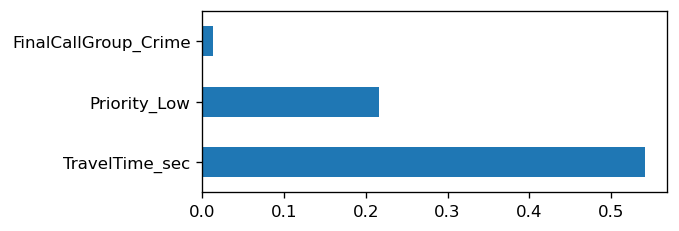

In [44]:
feat_importances = pd.Series(rf.feature_importances_, index=merged_rf.columns)
feat_importances.nlargest(3).plot(kind='barh',figsize=(5,2))

In [46]:

merged_regression=merged
np.seterr(divide = 'ignore')
merged_regression['log_TimeInQueue_sec']=  np.where(merged_regression['TimeInQueue_sec']>0,np.log(merged_regression['TimeInQueue_sec']), 0)
merged_regression['log_ResponseTime_sec'] = np.where(merged_regression['ResponseTime_sec']>0, np.log(merged_regression['TimeInQueue_sec']), 0)


k= pd.to_datetime(merged_regression['Date'])
merged_regression['Year']=k.dt.year



ols_1 = sm.ols(formula='log_ResponseTime_sec ~ Priority',
                          data=merged_regression).fit()
ols_2 = sm.ols(formula='log_ResponseTime_sec ~ Priority+Neighborhood',
                          data=merged_regression).fit()

ols_3 = sm.ols(formula='log_ResponseTime_sec ~ FinalCallGroup+Neighborhood',
                          data=merged_regression).fit()

ols_4 = sm.ols(formula='log_ResponseTime_sec ~FinalCallCategory+Neighborhood',
                          data=merged_regression).fit()

ols_5 = sm.ols(formula='log_ResponseTime_sec ~FinalCallCategory+Neighborhood',
                          data=merged_regression).fit()

ols_6 = sm.ols(formula='log_ResponseTime_sec ~FinalCallCategory+Neighborhood + Year',
                data=merged_regression).fit()
                
 
#ols_7 = smf.mixedlm(formula='log_ResponseTime_sec ~FinalCallCategory+ Year',
               #  data=merged_regression,groups=merged_regression["Neighborhood"]).fit()
                             
#ls_8 =  smf.mixedlm('log_Total_Offenses ~ First_Lockdown + log_median_household_income + unemployed_perc + people_below_poverty +  perc_diff_state_last_year + commute_by_walking_perc',n_month_crime_with_brightness, groups=n_month_crime_with_brightness["Neighborhood"]).fit()

          
               



reg1 = ols_1
reg2 = ols_2
reg3 = ols_3
reg4 = ols_4
reg5 = ols_5
reg6 = ols_6



results = summary_col([reg1, reg2, reg3, reg4,reg5,reg6],stars=True,float_format='%0.2f',
                  model_names=['Model\n(1)', 'Model\n(2)', 'Model\n(3)',  'Model\n(4)', 
                               'Model\n(5)',  'Model\n(6)'],regressor_order= ['Priority[T.Medium]','Priority[T.Low]'],
                  drop_omitted= True,
                  info_dict={'N':lambda x: "{0:d}".format(int(x.nobs)),
                             'R2':lambda x: "{:.2f}".format(x.rsquared)})
results





C:\Users\abrah\anaconda3\envs\space_farers\lib\site-packages\statsmodels\regression\linear_model.py:1666: RuntimeWarning: invalid value encountered in subtract
  return np.sum(weights * (model.endog - mean)**2)


,Model,Model,Model,Model,Model,Model
,(1),(2),(3),(4),(5),(6)
Priority[T.Medium],inf,1.10***,,,,
,(nan),(0.01),,,,
Priority[T.Low],inf,2.72***,,,,
,(nan),(0.01),,,,
R-squared,,0.29,0.08,0.14,0.14,0.14
R-squared Adj.,,0.29,0.08,0.14,0.14,0.14
N,246071,243256,243256,243256,243256,243256
R2,nan,0.29,0.08,0.14,0.14,0.14
